## Final annotation

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import seaborn as sb
import matplotlib.pyplot as plt
from matplotlib import rcParams

# verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.verbosity = 3               
sc.logging.print_version_and_date()

# making sure plots & clusters are reproducible
np.random.seed(42)

# custom functions
import sc_toolbox as sct

Running Scanpy 1.8.2, on 2024-08-02 12:52.


In [2]:
## path variables
adata_dir = '/mnt/smb2/Niklas/GLPG_data_temp/240731_GLPG_souped_filtered.h5ad'
data_dir = '/home/niklas/projects/GLPG_drug_perturbations/01_data/'
out_dir = '/home/niklas/projects/GLPG_drug_perturbations/04_annotation/04_02_figures/overall/'

In [3]:
## plotting variables
sc.settings.figdir = '/home/niklas/projects/GLPG_drug_perturbations/04_annotation/04_02_figures/overall/'
sc.set_figure_params(vector_friendly = True)
plt.rcParams['figure.figsize'] = (6, 5)
plt.rcParams['pdf.fonttype'] = 42

In [4]:
## load anndata object
adata = sc.read(adata_dir)

In [5]:
## have a look at the adata object: 449226 cells x 25194 genes
adata

AnnData object with n_obs × n_vars = 449226 × 25194
    obs: 'identifier', 'time_point', 'n_counts', 'preprocessing_cluster', 'size_factors', 'S_score', 'G2M_score', 'phase', 'treatment_time', 'treatment', 'sample_name', 'condition', 'percent_mito', 'cluster_03', 'GLPG_annotation', 'doublet_scores', 'n_genes', 'louvain_1', 'louvain_2'
    uns: 'GLPG_annotation_colors', 'louvain_1_colors'
    obsm: 'X_pca', 'X_umap'
    layers: 'counts', 'unsouped_counts'

### Transfer annotation tables

In [6]:
annotation_dir = '/home/niklas/projects/GLPG_drug_perturbations/04_annotation/04_01_data/'

In [7]:
endothelia_df = pd.read_csv(annotation_dir + 'annotation_table_endothelial_subset_NIKLAS.csv', sep="\t", index_col = 0)
epithelia_df = pd.read_csv(annotation_dir + 'annotation_table_epithelia_subset_NIKLAS.csv', sep="\t", index_col = 0)
granulocyte_df = pd.read_csv(annotation_dir + 'annotation_table_granulocyte_subset_NIKLAS.csv', sep="\t", index_col = 0)
lymphocyte_df = pd.read_csv(annotation_dir + 'annotation_table_lymphocyte_subset_NIKLAS.csv', sep="\t", index_col = 0)
megakaryocyte_df = pd.read_csv(annotation_dir + 'annotation_table_megakaryocyte_subset_NIKLAS.csv', sep="\t", index_col = 0)
mesenchyme_df = pd.read_csv(annotation_dir + 'annotation_table_mesenchyme_subset_NIKLAS.csv', sep="\t", index_col = 0)
mnp_df = pd.read_csv(annotation_dir + 'annotation_table_mnp_subset_NIKLAS.csv', sep="\t", index_col = 0)

In [8]:
## concatenate data frames into one barcodes - celltype table
all_lineage_df = [endothelia_df, epithelia_df, granulocyte_df, lymphocyte_df, megakaryocyte_df, mesenchyme_df, mnp_df]
meta_df = pd.concat(all_lineage_df, sort = False)
meta_df.head(5)

,cell_type,cell_type_compact
d100BLM_Combo48_AAAGAACAGTGCAAAT,aerocyte capillary EC,NaN
d100BLM_Combo48_AAAGGATAGATGAAGG,general capillary EC,NaN
d100BLM_Combo48_AAAGGGCGTTCCGTTC,Vwa1+/Col15a1+ ectopic capillary EC,NaN
d100BLM_Combo48_AAAGGTACAATTCACG,general capillary EC,NaN
d100BLM_Combo48_AAAGTCCCACGGATCC,general capillary EC,NaN


In [9]:
## create new meta data column and set to 'nan'
adata.obs['cell_type'] = np.nan

In [10]:
## retrieve cell type label assigned to each barcode and to .obs
adata.obs['cell_type'].update(pd.Series(meta_df.cell_type.values, name = 'cell_type', index = meta_df.index))

In [11]:
## get a brief overview over the cell type numbers
adata.obs['cell_type'].value_counts()

B cells                              79837
general capillary EC                 48520
M2 Macrophages                       36468
AM                                   30345
Lyve1-/Cd163- IM                     22515
                                     ...  
Lgr5+/Lgr6+ Fibroblasts activated      269
Proliferating IM                       162
aSMCs                                  153
Basal                                  105
NEC                                     44
Name: cell_type, Length: 64, dtype: int64

In [12]:
## delete old GLPG annotation
del adata.obs['GLPG_annotation']

/home/niklas/miniconda3/envs/niche_fibrosis_env/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'cell_type' as categorical


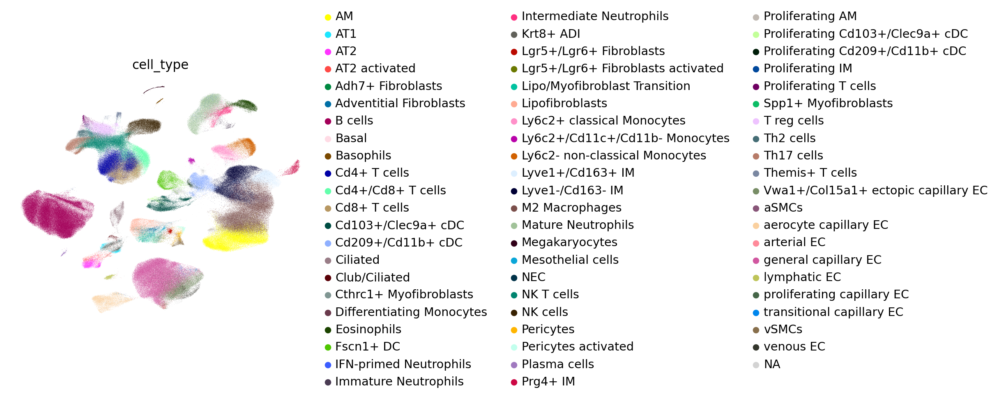

In [13]:
## first glimpse of UMAP
sc.pl.umap(adata, color = ['cell_type'], frameon = False)

### Remove non-annotated cells

In [14]:
adata = adata[-adata.obs['cell_type'].isna()]

### Re-calculate HVGs

In [15]:
## filter genes
sc.pp.filter_genes(adata, min_counts = 10)
sc.pp.filter_genes(adata, min_cells = 10)

filtered out 693 genes that are detected in less than 10 counts


Trying to set attribute `.var` of view, copying.


filtered out 1 genes that are detected in less than 10 cells


extracting highly variable genes
    finished (0:01:09)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/home/niklas/miniconda3/envs/niche_fibrosis_env/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/home/niklas/miniconda3/envs/niche_fibrosis_env/lib/python3.8/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:>

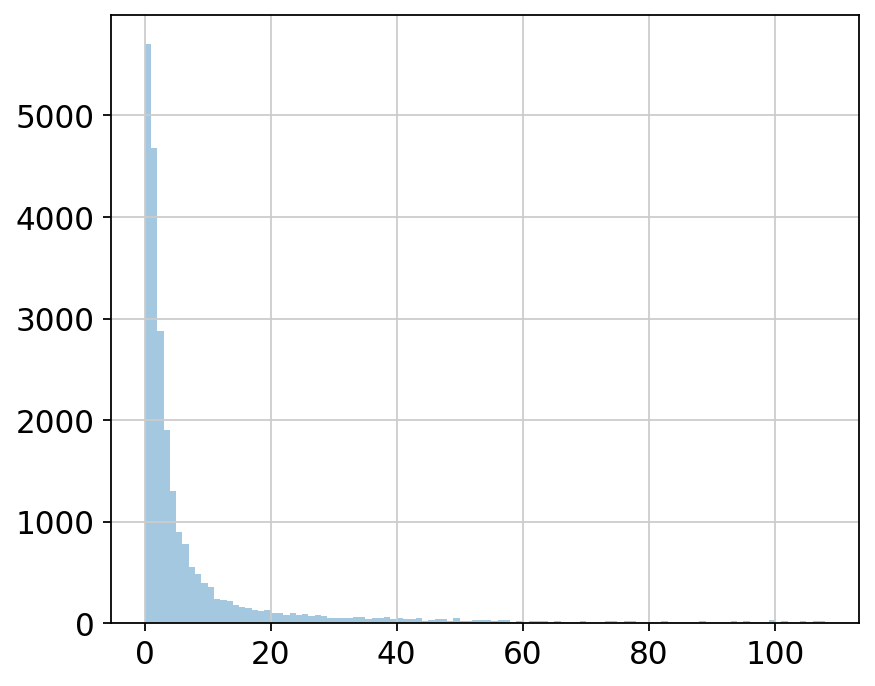

In [16]:
## compute HVGs per batch ('identifier') using seurat method
batch = 'identifier'
sc.pp.highly_variable_genes(adata, min_disp = None, max_disp = None, min_mean = None, max_mean = None, 
                                batch_key = batch, n_top_genes = 2000, n_bins = 20, flavor = 'seurat', 
                                subset = False)
vartab = pd.DataFrame(adata.var['highly_variable_nbatches'], index = adata.var_names)
sb.distplot(vartab, kde = False, bins = len(np.unique(adata.obs[batch])))

In [17]:
## only consider a gene as variabel if variable in at least 10 batches
thresh = 10
hvgs = vartab[vartab.highly_variable_nbatches.values >= thresh].index
print('%s Genes kept, variable in at least %s samples' %(len(hvgs), thresh))

4926 Genes kept, variable in at least 10 samples


In [18]:
## remove cell cycle genes (MOUSE) from list of HVGs
all_cc_genes = pd.read_table('/home/niklas/data/gene_lists/macosko_cell_cycle_genes.txt', header=0)
cc_genes = np.concatenate([all_cc_genes['IG1.S'], all_cc_genes['S'], all_cc_genes['G2.M'], all_cc_genes['M'], all_cc_genes['M.G1']]).astype(str)
cc_genes = [cc_genes[i] for i in np.arange(0,len(cc_genes))]
cc_genes = [cc_genes[i].capitalize() for i in np.arange(0,len(cc_genes))]
hvgs = np.setdiff1d(hvgs, cc_genes)

In [19]:
## set HVGs
adata.var['highly_variable'] = [g in hvgs for g in adata.var_names]
## no. of resulting HVGs
sum(adata.var['highly_variable'])

4825

### PCA

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:30)


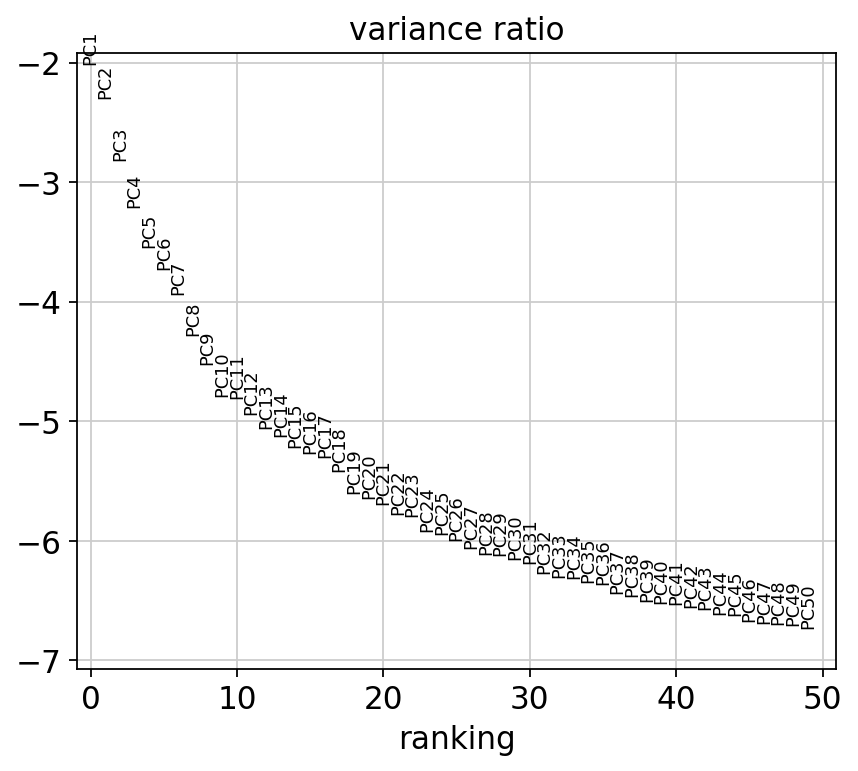

In [20]:
## PCA
sc.pp.pca(adata, use_highly_variable = True)
sc.pl.pca_variance_ratio(adata, n_pcs=50, log=True)

### UMAP visualization

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:03:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:04:31)


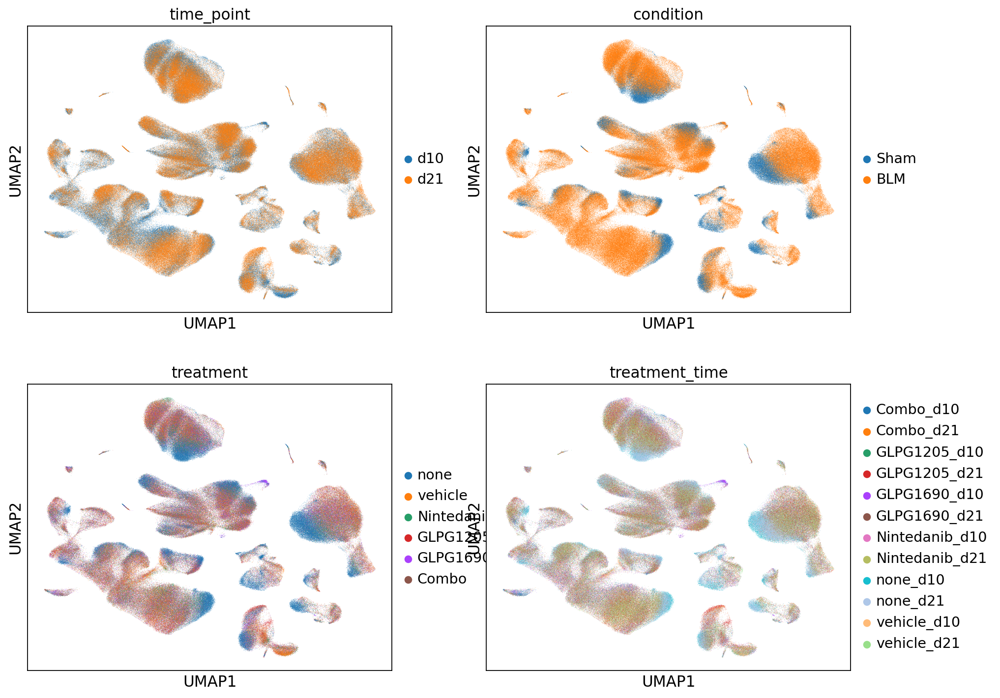

In [21]:
sc.pp.neighbors(adata, n_pcs = 50, n_neighbors = 30)
sc.tl.umap(adata)
sc.pl.umap(adata, color = ['time_point', 'condition','treatment','treatment_time'], ncols = 2)

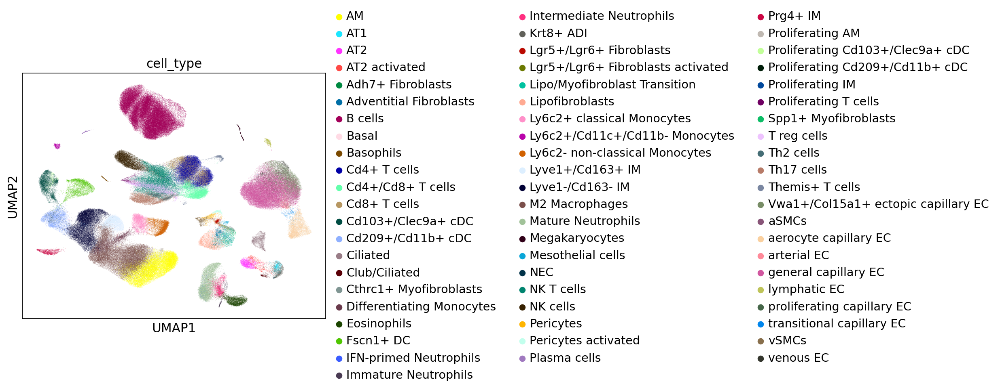

In [22]:
sc.pl.umap(adata, color = 'cell_type')

In [23]:
## save data
adata.write('/mnt/smb2/Niklas/GLPG_data_temp/240731_GLPG_annotated.h5ad')

### Rename and reorder some cell types

In [24]:
### rename some cell types for clarification/visualization purposes
adata.obs['cell_type'] = ['Mesothelial' if ct == 'Mesothelial cells' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['Transitional Monocytes' if ct == 'Differentiating Monocytes' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['Classical Monocytes' if ct == 'Ly6c2+ classical Monocytes' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['Intermediate Monocytes' if ct == 'Ly6c2+/Cd11c+/Cd11b- Monocytes' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['Non-classical Monocytes' if ct == 'Ly6c2- non-classical Monocytes' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['cDC1' if ct == 'Cd103+/Clec9a+ cDC' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['cDC2' if ct == 'Cd209+/Cd11b+ cDC' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['pDC' if ct == 'Fscn1+ DC' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['Proliferating cDC1' if ct == 'Proliferating Cd103+/Clec9a+ cDC' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['Proliferating cDC2' if ct == 'Proliferating Cd209+/Cd11b+ cDC' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['Aerocyte capillary EC' if ct == 'aerocyte capillary EC' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['Transitional capillary EC' if ct == 'transitional capillary EC' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['General capillary EC' if ct == 'general capillary EC' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['Proliferating capillary EC' if ct == 'proliferating capillary EC' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['Arterial EC' if ct == 'arterial EC' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['Venous EC' if ct == 'venous EC' else ct for ct in adata.obs['cell_type']]
adata.obs['cell_type'] = ['Lymphatic EC' if ct == 'lymphatic EC' else ct for ct in adata.obs['cell_type']]

In [25]:
adata.obs['cell_type'] = adata.obs['cell_type'].astype('category')
adata.obs.cell_type.cat.categories

Index(['AM', 'AT1', 'AT2', 'AT2 activated', 'Adh7+ Fibroblasts',
       'Adventitial Fibroblasts', 'Aerocyte capillary EC', 'Arterial EC',
       'B cells', 'Basal', 'Basophils', 'Cd4+ T cells', 'Cd4+/Cd8+ T cells',
       'Cd8+ T cells', 'Ciliated', 'Classical Monocytes', 'Club/Ciliated',
       'Cthrc1+ Myofibroblasts', 'Eosinophils', 'General capillary EC',
       'IFN-primed Neutrophils', 'Immature Neutrophils',
       'Intermediate Monocytes', 'Intermediate Neutrophils', 'Krt8+ ADI',
       'Lgr5+/Lgr6+ Fibroblasts', 'Lgr5+/Lgr6+ Fibroblasts activated',
       'Lipo/Myofibroblast Transition', 'Lipofibroblasts', 'Lymphatic EC',
       'Lyve1+/Cd163+ IM', 'Lyve1-/Cd163- IM', 'M2 Macrophages',
       'Mature Neutrophils', 'Megakaryocytes', 'Mesothelial', 'NEC',
       'NK T cells', 'NK cells', 'Non-classical Monocytes', 'Pericytes',
       'Pericytes activated', 'Plasma cells', 'Prg4+ IM', 'Proliferating AM',
       'Proliferating IM', 'Proliferating T cells', 'Proliferating cDC1',
 

In [26]:
order = [
    ### epithelium ###
    'AT1', 
    'AT2', 
    'AT2 activated',
    'Krt8+ ADI',
    'Basal', 
    'Club/Ciliated',
    'Ciliated',
    'NEC',
    ### endothelium ###
    'Aerocyte capillary EC',
    'Transitional capillary EC',
    'General capillary EC',
    'Proliferating capillary EC',
    'Vwa1+/Col15a1+ ectopic capillary EC',
    'Arterial EC',
    'Venous EC',
    'Lymphatic EC',
    ### mesenchyme ###
    'Adventitial Fibroblasts',
    'Adh7+ Fibroblasts',
    'Lgr5+/Lgr6+ Fibroblasts',
    'Lgr5+/Lgr6+ Fibroblasts activated',
    'Lipofibroblasts',
    'Lipo/Myofibroblast Transition',
    'Cthrc1+ Myofibroblasts',
    'Spp1+ Myofibroblasts',
    'Pericytes',
    'Pericytes activated',
    'aSMCs',
    'vSMCs',
    'Mesothelial',
    ### MNPs ###
    'Non-classical Monocytes',
    'Classical Monocytes',
    'Intermediate Monocytes',
    'Transitional Monocytes',
    'M2 Macrophages',
    'AM',
    'Proliferating AM',
    'Prg4+ IM',
    'Lyve1+/Cd163+ IM',
    'Lyve1-/Cd163- IM',
    'Proliferating IM', 
    'cDC1', 
    'cDC2',
    'pDC',
    'Proliferating cDC1',
    'Proliferating cDC2',
    ### Megakaryocytes ###
    'Megakaryocytes',
    ### Granulocytes ###
    'Basophils',
    'Eosinophils',
    'Immature Neutrophils',
    'Intermediate Neutrophils',
    'Mature Neutrophils',
    'IFN-primed Neutrophils',
    ### Lymphocytes ###
    'B cells',
    'Plasma cells',
    'Cd4+ T cells', 
    'Cd8+ T cells',
    'Cd4+/Cd8+ T cells',
    'T reg cells',
    'Th2 cells',
    'Th17 cells',
    'Themis+ T cells',
    'Proliferating T cells',
    'NK T cells',
    'NK cells'    
]

In [27]:
result = [item for item in order if item not in adata.obs.cell_type.cat.categories.to_list()]
result

[]

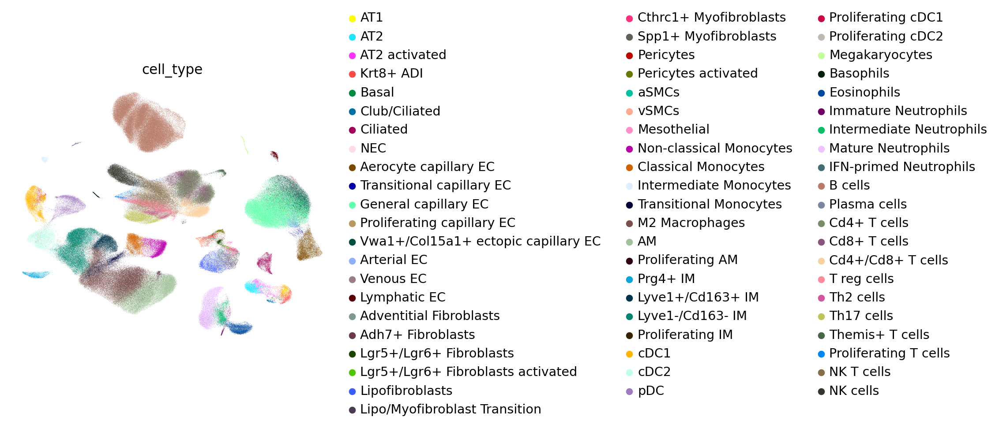

In [28]:
## reorder categories
adata.obs['cell_type'] = adata.obs['cell_type'].cat.reorder_categories([
    ### epithelium ###
    'AT1', 
    'AT2', 
    'AT2 activated',
    'Krt8+ ADI',
    'Basal', 
    'Club/Ciliated',
    'Ciliated',
    'NEC',
    ### endothelium ###
    'Aerocyte capillary EC',
    'Transitional capillary EC',
    'General capillary EC',
    'Proliferating capillary EC',
    'Vwa1+/Col15a1+ ectopic capillary EC',
    'Arterial EC',
    'Venous EC',
    'Lymphatic EC',
    ### mesenchyme ###
    'Adventitial Fibroblasts',
    'Adh7+ Fibroblasts',
    'Lgr5+/Lgr6+ Fibroblasts',
    'Lgr5+/Lgr6+ Fibroblasts activated',
    'Lipofibroblasts',
    'Lipo/Myofibroblast Transition',
    'Cthrc1+ Myofibroblasts',
    'Spp1+ Myofibroblasts',
    'Pericytes',
    'Pericytes activated',
    'aSMCs',
    'vSMCs',
    'Mesothelial',
    ### MNPs ###
    'Non-classical Monocytes',
    'Classical Monocytes',
    'Intermediate Monocytes',
    'Transitional Monocytes',
    'M2 Macrophages',
    'AM',
    'Proliferating AM',
    'Prg4+ IM',
    'Lyve1+/Cd163+ IM',
    'Lyve1-/Cd163- IM',
    'Proliferating IM', 
    'cDC1', 
    'cDC2',
    'pDC',
    'Proliferating cDC1',
    'Proliferating cDC2',
    ### Megakaryocytes ###
    'Megakaryocytes',
    ### Granulocytes ###
    'Basophils',
    'Eosinophils',
    'Immature Neutrophils',
    'Intermediate Neutrophils',
    'Mature Neutrophils',
    'IFN-primed Neutrophils',
    ### Lymphocytes ###
    'B cells',
    'Plasma cells',
    'Cd4+ T cells', 
    'Cd8+ T cells',
    'Cd4+/Cd8+ T cells',
    'T reg cells',
    'Th2 cells',
    'Th17 cells',
    'Themis+ T cells',
    'Proliferating T cells',
    'NK T cells',
    'NK cells'    
])
sc.pl.umap(adata, color = 'cell_type', frameon = False)

In [29]:
cell_type_colors = [
    '#E41A1C', '#377EB8', '#4DAF4A', '#984EA3', '#FF7F00',
    '#FFFF33', '#A65628', '#F781BF', '#999999', '#004301',
    '#00FFFF', '#00008F', '#5F0029', '#D3D3D3', '#4F4E51',
    '#B499FF', '#6700F9', '#4D006F', '#00806C', '#72FF9A',
    '#6A6C00', '#E1C78B', '#63C1FE', '#D90083', '#5A3500',
    '#42BBA9', '#B29A00', '#F203FF', '#920000', '#004F74',
    '#1F77B4', '#FF7F0E', '#2CA02C', '#D62728', '#9467BD',
    '#8C564B', '#E377C2', '#7F7F7F', '#BCBD22', '#17BECF',
    '#A6CEE3', '#1F78B4', '#B2DF8A', '#33A02C', '#FB9A99',
    '#E31A1C', '#FDBF6F', '#FF7F00', '#CAB2D6', '#6A3D9A',
    '#FFFF99', '#B15928', '#B3E2CD', '#FDCDAC', '#CBD5E8',
    '#F4CAE4', '#E6F5C9', '#FFF2AE', '#F1E2CC', '#CCCCCC',
    '#1B9E77', '#D95F02', '#7570B3', '#E7298A'
]

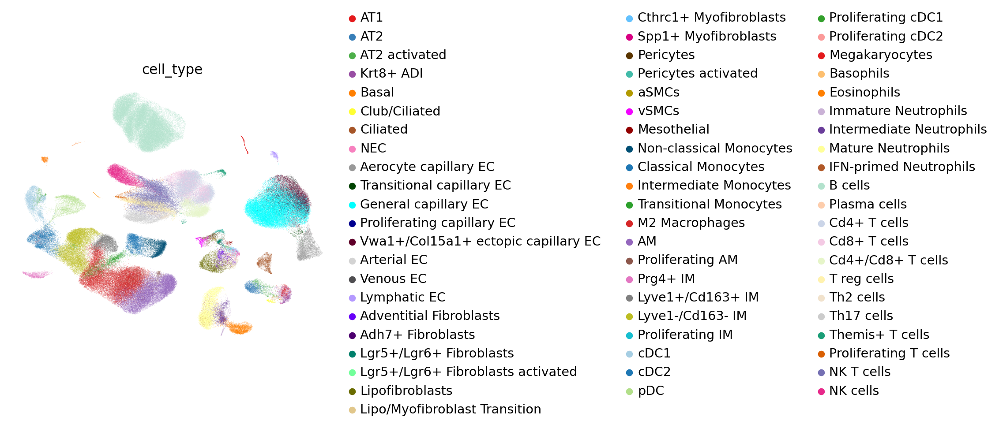

In [30]:
sc.pl.umap(adata, color = 'cell_type', palette = cell_type_colors, frameon = False)

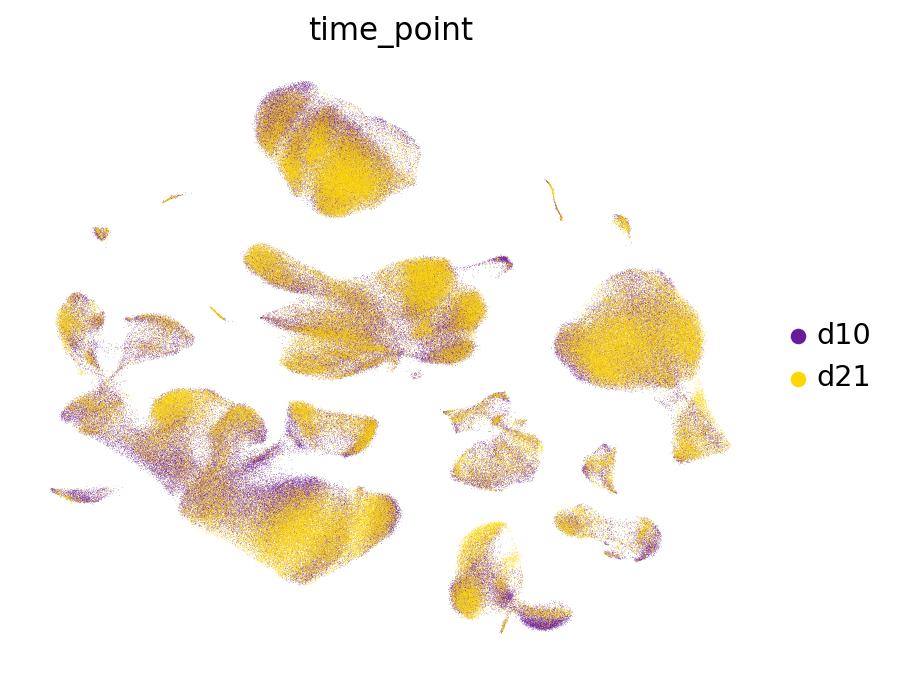

In [31]:
timepoint_colors = ['#6A1B9A', '#FFD700']
sc.pl.umap(adata, color = 'time_point', palette = timepoint_colors, frameon = False)

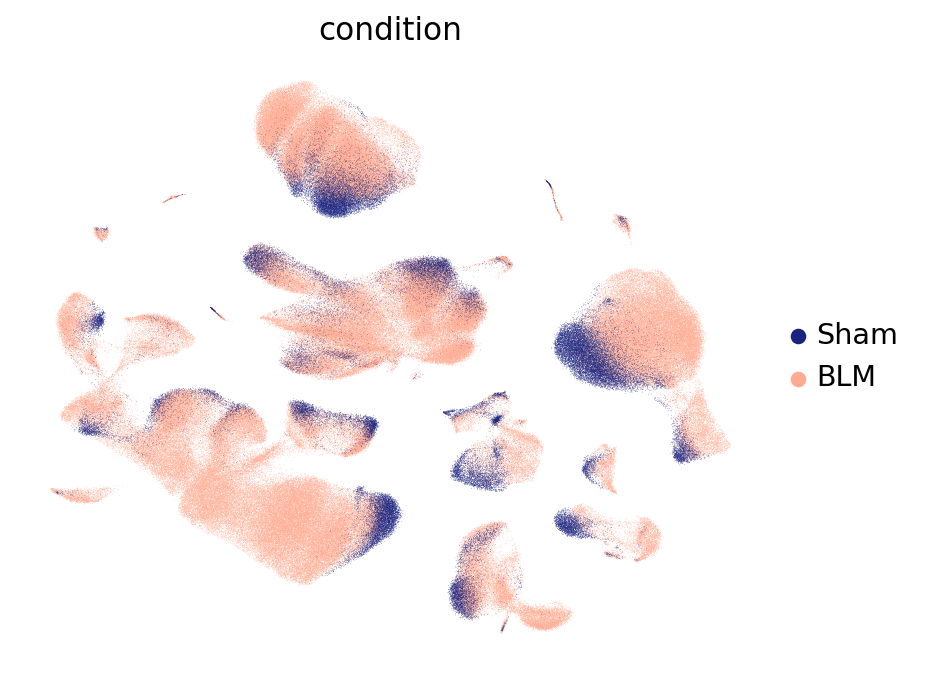

In [32]:
condition_colors = ['#1A237E', '#FFAB91']
sc.pl.umap(adata, color = 'condition', palette = condition_colors, frameon = False)

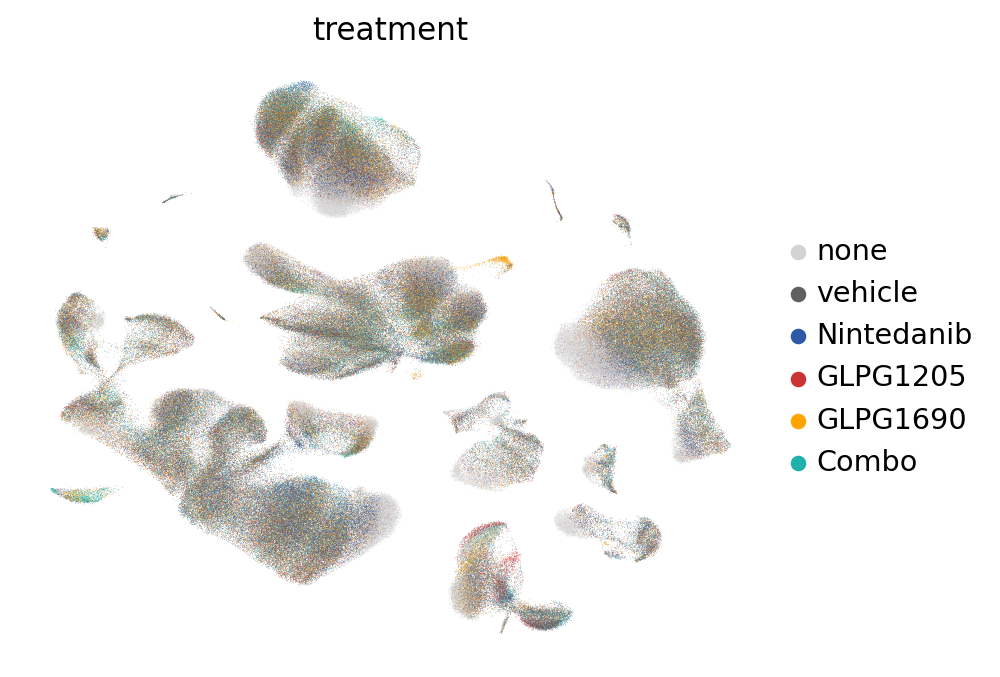

In [33]:
treatment_colors = ['#D3D3D3', '#606060', '#2E59A8', '#C93333', '#FFA500', '#20B2AA']
sc.pl.umap(adata, color = 'treatment', palette = treatment_colors, frameon = False)

In [34]:
## rename treatment_time label
treatment_time_conversion = {'none_d10' : 'Control_d10',
                             'none_d21' : 'Control_d21',
                             'vehicle_d10' : 'BLM+PBS_d10',
                             'vehicle_d21' : 'BLM+PBS_d21',
                             'Nintedanib_d10' : 'BLM+Nintedanib_d10',
                             'Nintedanib_d21' : 'BLM+Nintedanib_d21',
                             'GLPG1205_d10' : 'BLM+GLPG1205_d10',
                             'GLPG1205_d21' : 'BLM+GLPG1205_d21',
                             'GLPG1690_d10' : 'BLM+GLPG1690_d10',
                             'GLPG1690_d21' : 'BLM+GLPG1690_d21',
                             'Combo_d10' : 'BLM+Combo_d10',
                             'Combo_d21' : 'BLM+Combo_d21'
}
adata.obs['treatment_time'] = [treatment_time_conversion[tt] for tt in adata.obs['treatment_time']]

In [35]:
## reorder treatment_time label
adata.obs['treatment_time'] = adata.obs['treatment_time'].astype('category')
adata.obs['treatment_time'] = adata.obs['treatment_time'].cat.reorder_categories(['Control_d10',
                                                                                  'Control_d21',
                                                                                  'BLM+PBS_d10',
                                                                                  'BLM+PBS_d21',
                                                                                  'BLM+Nintedanib_d10',
                                                                                  'BLM+Nintedanib_d21',
                                                                                  'BLM+GLPG1205_d10',
                                                                                  'BLM+GLPG1205_d21',
                                                                                  'BLM+GLPG1690_d10',
                                                                                  'BLM+GLPG1690_d21',
                                                                                  'BLM+Combo_d10',
                                                                                  'BLM+Combo_d21'
                                                                                 ]
                                                                                )

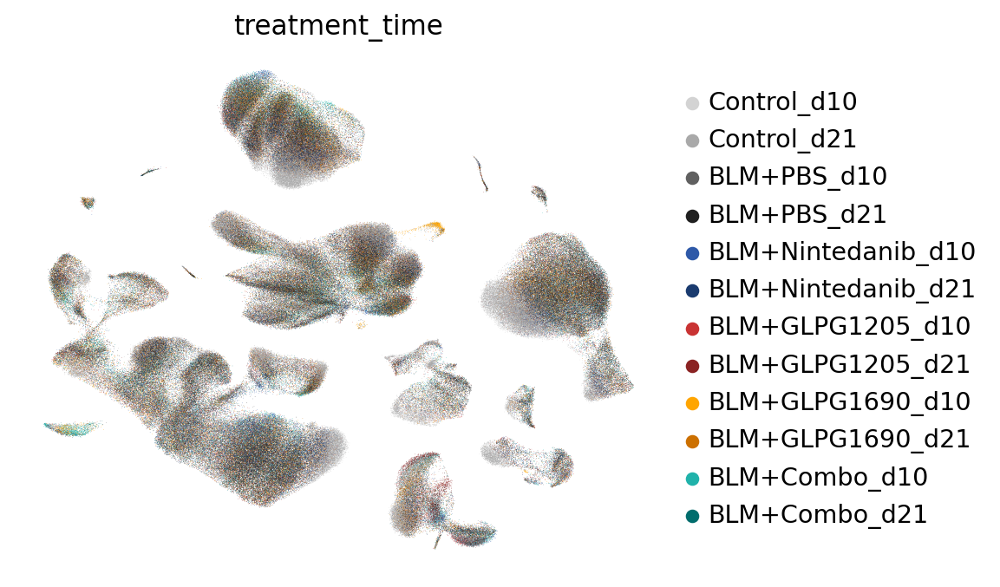

In [36]:
treatment_time_colors =  [
    '#D3D3D3', '#A9A9A9',  # Light Grey Pair
    '#606060', '#202020',  # Dark Grey Pair
    '#2E59A8', '#1A3B6F',  # Blue Pair
    '#C93333', '#8B2323',  # Red Pair
    '#FFA500', '#CC7000',  # Orange Pair
    '#20B2AA', '#006D6D'   # Teal Pair
]
sc.pl.umap(adata, color = 'treatment_time', palette = treatment_time_colors, frameon = False)

In [37]:
## save data
adata.write('/mnt/smb2/Niklas/GLPG_data_temp/240731_GLPG_annotated.h5ad')

### Summary Figures

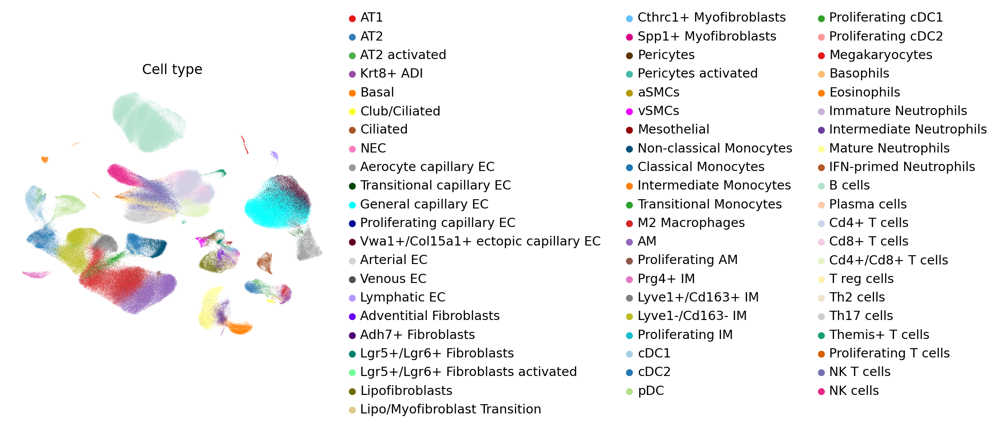

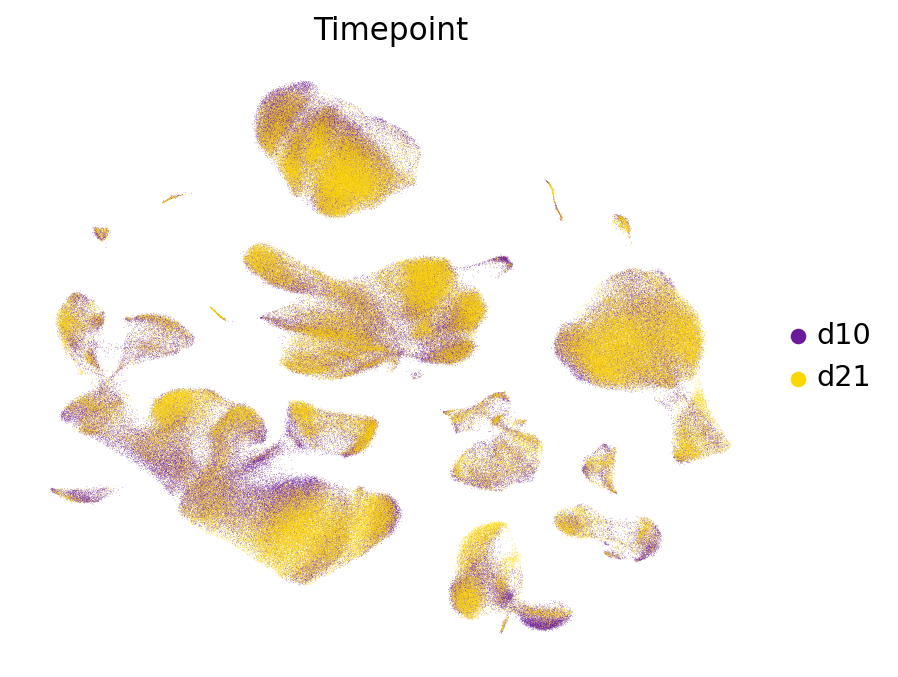

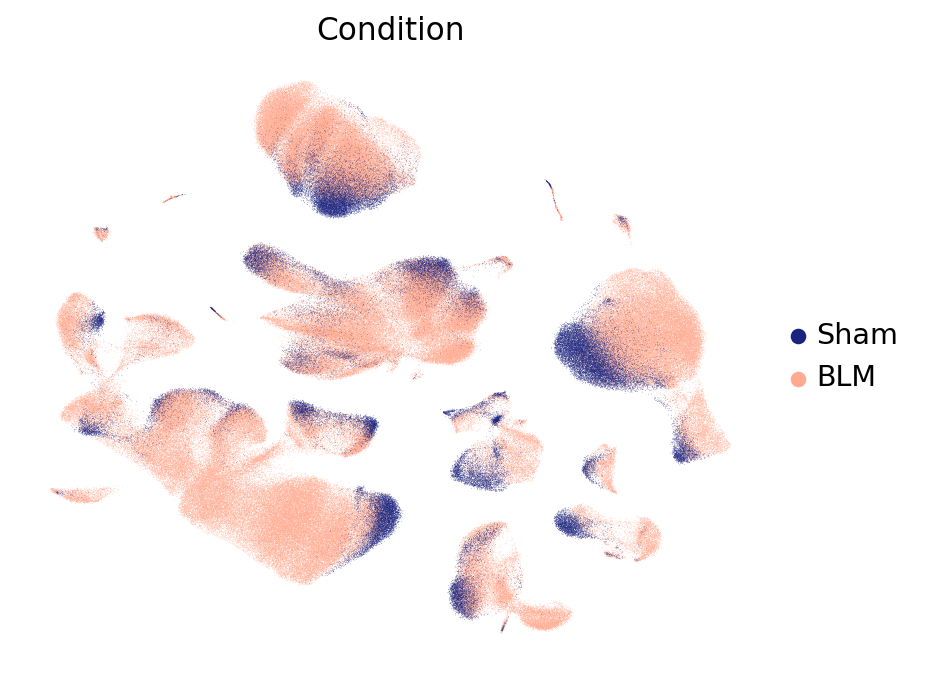

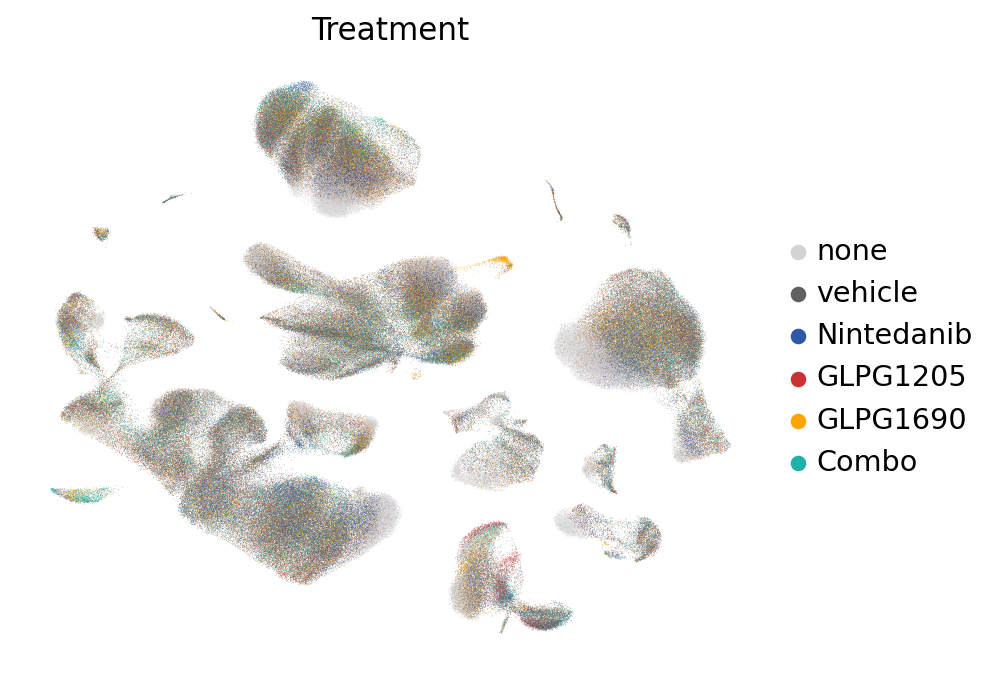

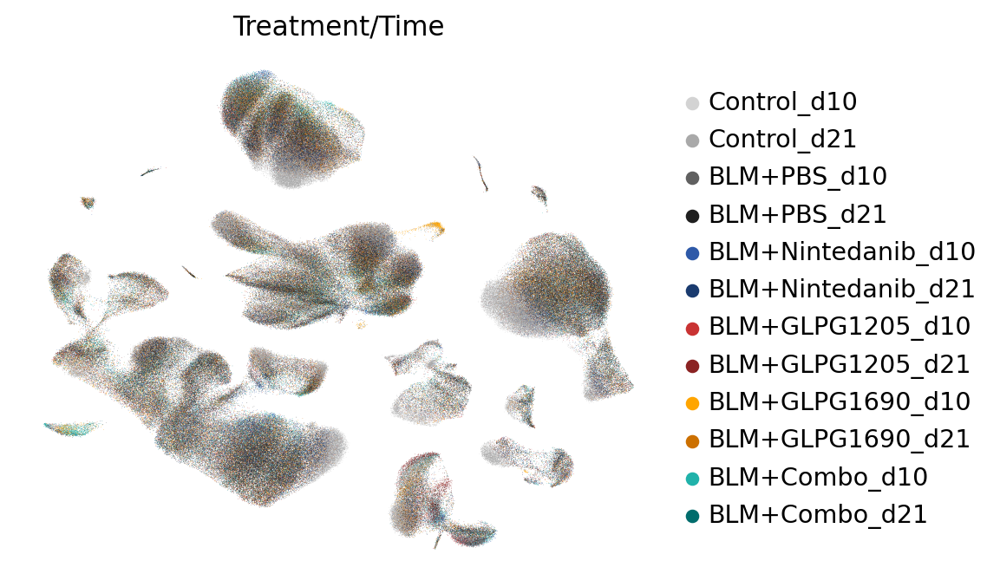

In [38]:
## save UMAP for presentation
sc.pl.umap(adata, color = ['cell_type'], title = 'Cell type', frameon = False, size = 0.4,
           save = '_celltype.pdf')
sc.pl.umap(adata, color = ['time_point'], title = 'Timepoint', frameon = False, 
           save = '_timepoint.pdf')
sc.pl.umap(adata, color = ['condition'], title = 'Condition', frameon = False,
           save = '_condition.pdf')
sc.pl.umap(adata, color = ['treatment'], title = 'Treatment', frameon = False,
           save = '_treatment.pdf')
sc.pl.umap(adata, color = ['treatment_time'], title = 'Treatment/Time', frameon = False, 
           save = '_treatment_time.pdf')